# opencv 임포트 및 버전확인

In [1]:
# opencv 모듈인 cv2 버전 확인

import cv2

print(cv2.__version__)

4.1.2


# 구글 드라이브 마운트

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
# 심볼릭 링크 생성
!ln -s /content/gdrive/MyDrive/ /mydrive  

# 필요한 사진 구글 드라이브에서 복사해오기

In [4]:
# 워킹 디렉토리 확인
!pwd

/content


In [5]:
# 사진 복사하기
!cp /mydrive/data/*.jpg ./

In [ ]:
# import gdown
# !gdown --id 1ZHxechpRmC4ixi3CaJIQ9c93hJP_5h71 --output data.zip
# !unzip data.zip -d /mydrive/

In [6]:
!ls *.jpg

bill_gates.jpg	cat3.jpg  dog2.jpg  dog.jpg   Musk_jobs_gates.jpg
cat2.jpg	cat.jpg   dog3.jpg  jobs.jpg


# OpenCV 함수

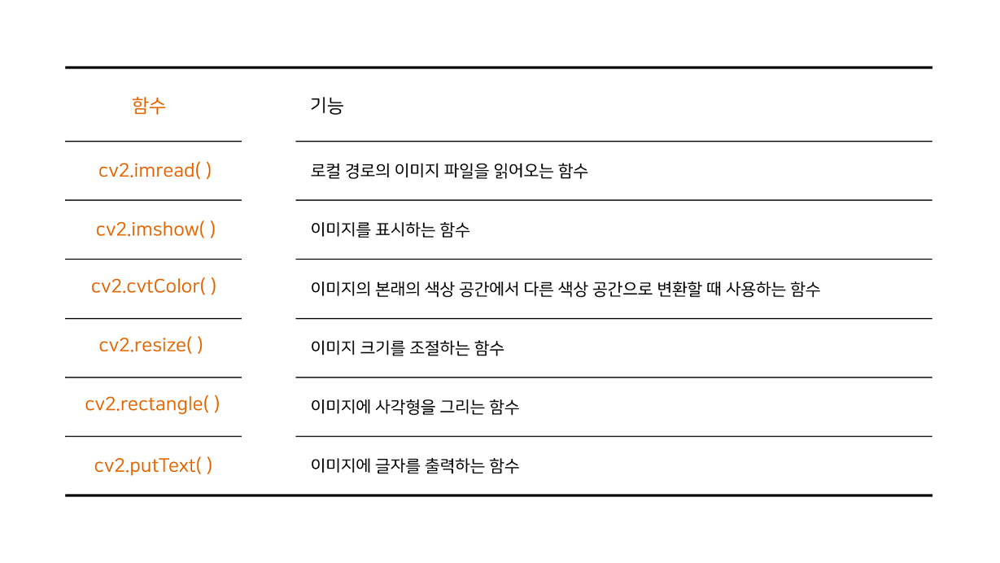

# 이미지 입력, 표시 함수 - cv2.imread( ), cv2.imshow( )

 cv2.imread() 함수는 로컬 경로의 이미지 파일을 읽어오는 함수이고 cv2.imshow() 함수는 이미지를 표시하는 함수입니다.






 **image = cv2.imread(fileName, flags)**

fileName :  이미지의 상대경로 또는 절대경로  
flags : 이미지를 불러올 때 적용할 초기 상태

👉 flags 인자값


    cv2.IMREAD_COLOR : 3 채널, BGR 이미지 사용 (default)  
    cv2.IMREAD_GRAYSCALE : 1 채널, 그레이스케일 적용  
    cv2.IMREAD_UNCHANGED : 원본 사용
    

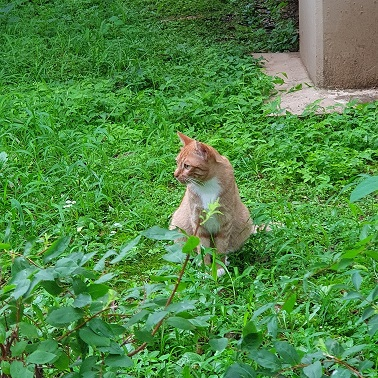

In [9]:
# 사진 로드하기
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread ('cat.jpg', cv2.IMREAD_COLOR)

cv2_imshow(image)  # 이미지 표시 함수. Colab
# cv2.imshow('window', image)  # jupyter notebook 

예제1. dog.jpg 이미지를 로드하세요

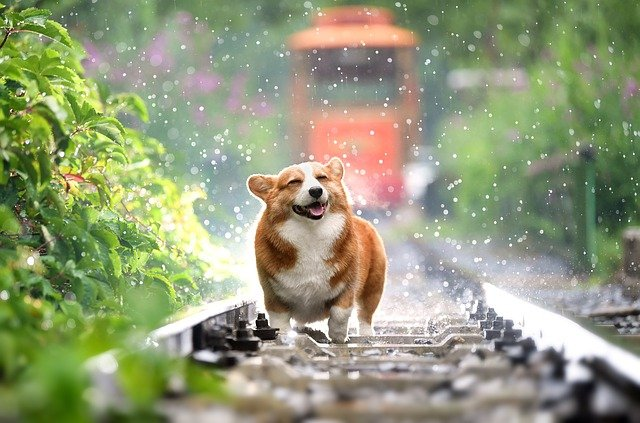

In [10]:
image = cv2.imread('dog.jpg', cv2.IMREAD_COLOR)
cv2_imshow(image)

# 색상 공간 변환 함수 - cv2.cvtColor( )


색상 공간 변환(Convert Color)은 본래의 색상 공간에서 다른 색상 공간으로 변환할 때 사용합니다.  
색상 공간 변환 함수는 데이터 타입을 같게 유지하고 채널을 변환합니다.





**dst = cv2.cvtcolor(src, code, dstCn)**

src : 입력 이미지  
code : 색상 변환 코드. [원본 이미지 색상 공간 / 2 / 결과 이미지 색상 공간]  
dstCn : 출력채널. 출력 이미지에 필요한 채널의 수를 설정  

👉 색상 공간 코드

    속성	             의미	                         비고
    BGR	        Blue, Green, Red 채널	               -
    RGB	        Red, Green, Blue 채널	               -
    GRAY       	단일 채널                           그레이스케일



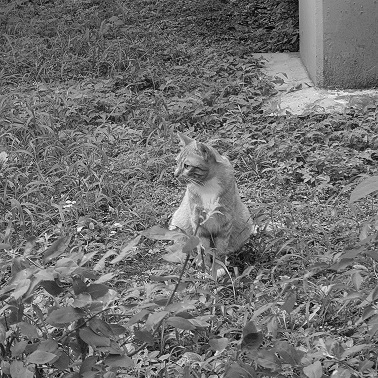

In [11]:
import cv2
from google.colab.patches import cv2_imshow

src = cv2.imread('cat.jpg', cv2.IMREAD_COLOR)
dst = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)     # COLOR_BGR2GRAY : 색상 공간을 BGR 에서 GRAY 로 변경

cv2_imshow(dst)

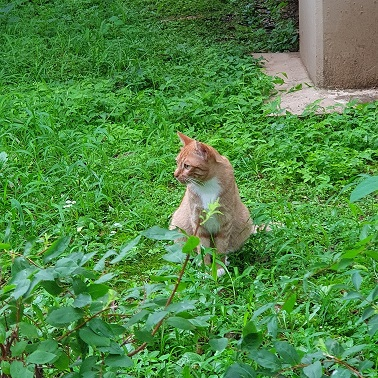

In [13]:
dst1 = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)     # COLOR_BGR2RGB : 색상 공간을 BGR 에서 RGB 로 변경
dst1 = cv2.cvtColor(dst1, cv2.COLOR_BGR2RGB)
cv2_imshow(dst1)

예제2. dog.jpg 이미지를 로드하여 색상공간을 흑백으로 변경하세요

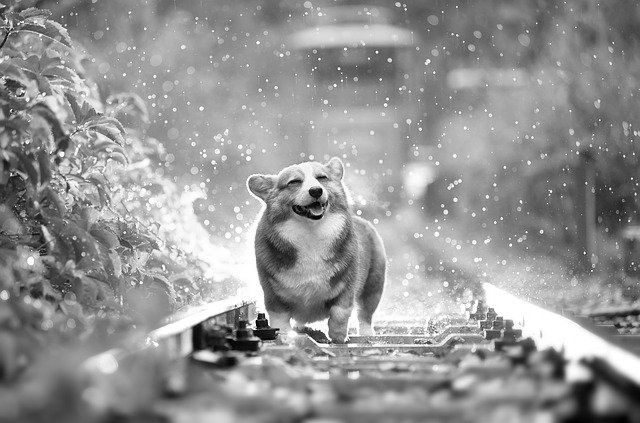

In [16]:
src = cv2.imread('dog.jpg', cv2.IMREAD_COLOR)
src = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
cv2_imshow(src)

# 크기 조절 함수 - cv2.resize()

* 이미지 크기를 조절하는 방법

    ① 사용자가 요구하는 절대 크기로 변경

    ② 비율에 맞게 상대 크기로 변경 (입력 이미지의 크기와 비례하도록 너비와 높이가 계산)

**dst = cv2.resize(src, dstSize, fx, fy, interpolation)**  

src : 입력 이미지  
dstSize : 절대 크기  
fx, fy : 상대 크기  
interpolation : 보간법

👉interpolation  

        속성                      의미  
    cv2.INTER_NEAREST        이웃 보간법  
    cv2.INTER_LINEAR         쌍 선형 보간법 (가장 많이 사용)  
    cv2.INTER_LINEAR_EXACT   비트 쌍 선형 보간법  
    cv2.INTER_CUBIC          바이큐빅 보간법   
    cv2.INTER_AREA           영역 보간법  
    cv2.INTER_LANCZOS4       Lanczos 보간법  

(378, 378, 3)


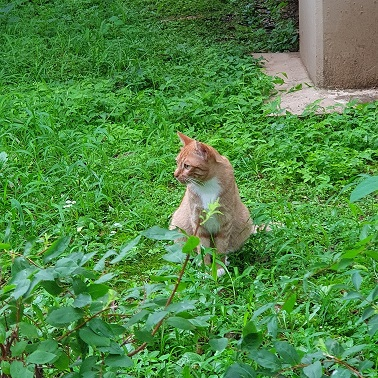

(300, 200, 3)


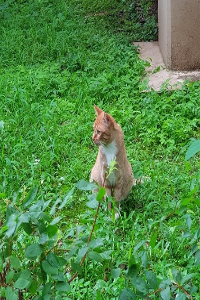

In [17]:
import cv2
from google.colab.patches import cv2_imshow

src = cv2.imread('cat.jpg', cv2.IMREAD_COLOR)

# 절대 크기 변경
dst = cv2.resize(src, dsize=(200, 300), interpolation=cv2.INTER_LINEAR)   # dsize= 생략하고 (200,300) 으로 기입 가능

print(src.shape)  # (세로, 가로, 색상공간)
cv2_imshow(src)

print(dst.shape)
cv2_imshow(dst)

(189, 189, 3)


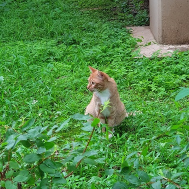

In [20]:
# 상대 크기 변경
# 절대 크기에 (0, 0)을 할당한 다음, 상대 크기의 값을 할당해 사용
# 절대 크기에 (0, 0)을 할당하는 이유로는 fx와 fy에서 계산된 크기가 dsize에 할당되기 때문
dst2 = cv2.resize(src, dsize=(0,0), fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)

print(dst2.shape)
cv2_imshow(dst2)

(265, 113, 3)


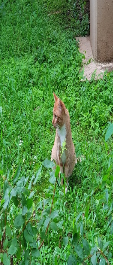

In [21]:
dst3 = cv2.resize(src, dsize=(0,0), fx=0.3, fy=0.7, interpolation=cv2.INTER_LINEAR)

print(dst3.shape)  # (세로, 가로, 색상공간)
cv2_imshow(dst3)

예제3. dog2.jpg 이미지를 로드하여 상대크기 가로 0.4, 세로 0.6 으로 resize 하세요

(778, 778, 3)
(467, 311, 3)


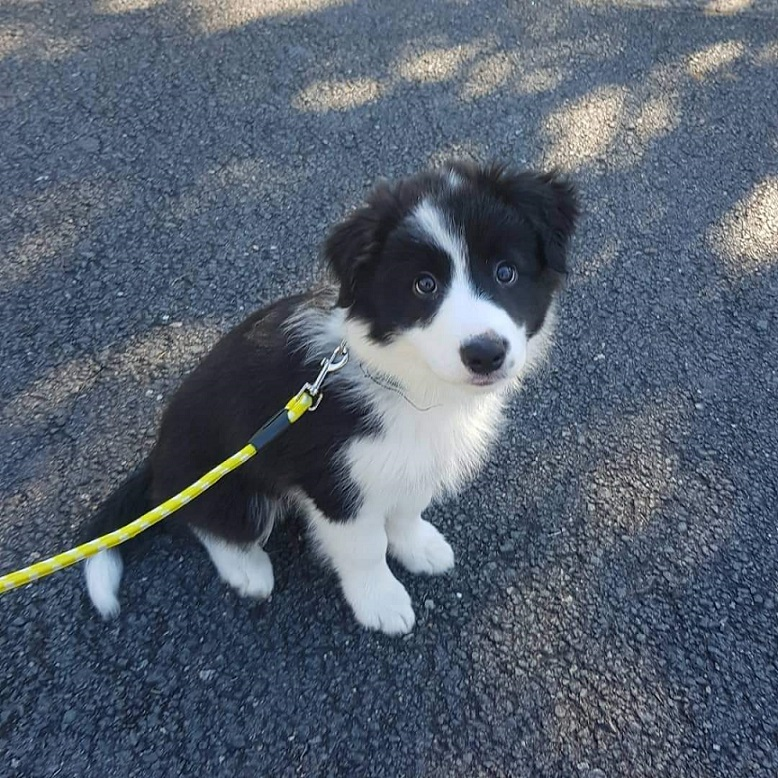

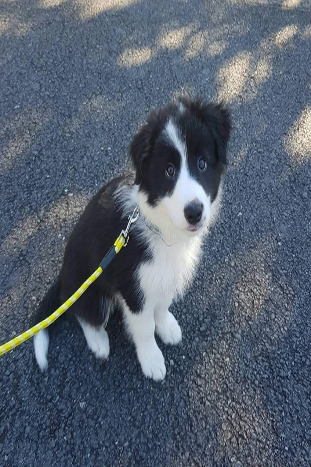

In [25]:
src = cv2.imread('dog2.jpg', cv2.IMREAD_COLOR)
dst = cv2.resize(src, dsize=(0,0), fx=0.4, fy=0.6, interpolation=cv2.INTER_LINEAR)
print(src.shape)
print(dst.shape)
cv2_imshow(src)
cv2_imshow(dst)

# 사각형 그리기 함수 - cv2.rectangle()



**dst = cv2.rectangle(src, pt1, pt2, color, thickness)**

src : 이미지 파일  
pt1 : 좌측 상단 모서리 좌표 (x, y)  
pt2 : 우측 상단 모서리 좌표 (x, y)  
color : 색상 (B, G, R) 0~255    
thickness : 두께 (default 1)  


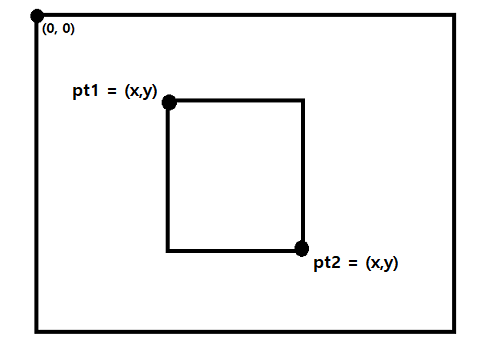

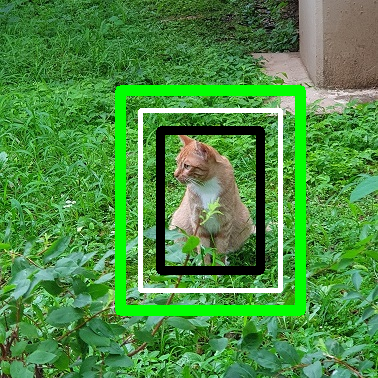

In [34]:
import cv2
from google.colab.patches import cv2_imshow

# color 설정 BGR
blue = (255, 0, 0)
green = (0, 255, 0)
red = (0, 0, 255)
black = (0, 0, 0)
white = (255, 255, 255)
color_list = [blue, green, red, black, white]

src = cv2.imread('cat.jpg', cv2.IMREAD_COLOR)
buf = cv2.rectangle(src, (160, 130), (260, 270), color_list[3], 7)
buf = cv2.rectangle(buf, (140, 110), (280, 290), color_list[4], 4)
buf = cv2.rectangle(buf, (120, 90), (300, 310), color_list[1], 9)
# cv2_imshow(src)
cv2_imshow(buf)

예제4. cat2.jpg 이미지를 로드하여 아래의 이미지처럼 고양이 얼굴에 사각형을 그려보세요

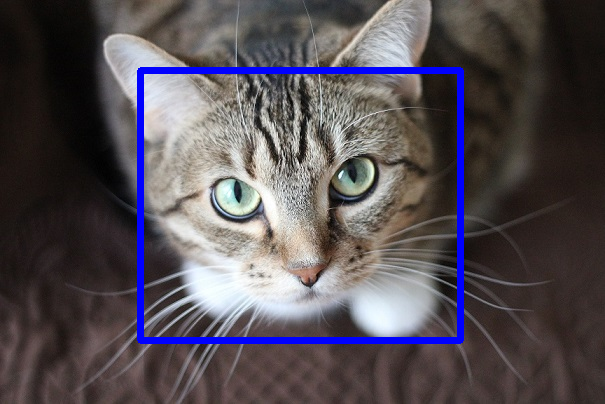

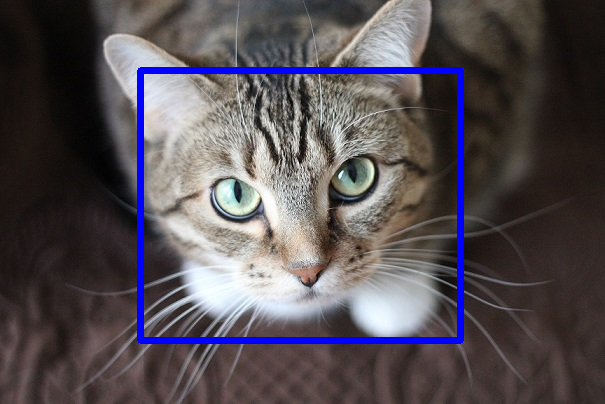

(404, 605, 3)

In [40]:
src = cv2.imread('cat2.jpg', cv2.IMREAD_COLOR)

buf = cv2.rectangle(src, (140,70),(460,340),(255,0,0),6)
cv2_imshow(buf)
src.shape

# 사진 잘라내기 

src[top:bottom, left:right] 를 이용하면 이미지에서 원하는 부분을 추출할 수 있습니다.

pt1 = (x,y) = (left, top)  
pt2 = (x,y) = (right, bottom)

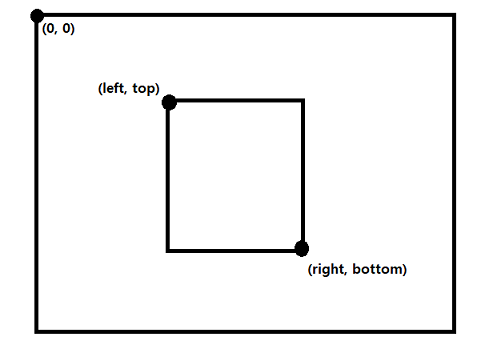

retangle(src, (left, top), (right, bottom))  
src[top:bottom, left:right]

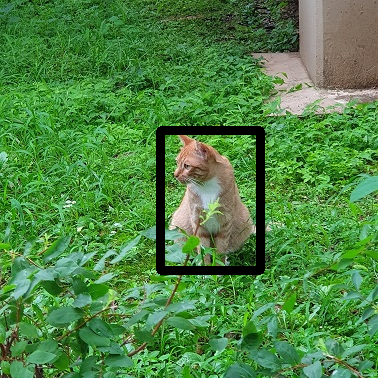

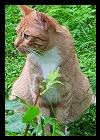

In [41]:
import cv2
from google.colab.patches import cv2_imshow

src = cv2.imread('cat.jpg', cv2.IMREAD_COLOR)
buf = cv2.rectangle(src, (160, 130), (260, 270), color_list[3], 7)
buf2 = buf[130:270, 160:260]

cv2_imshow(buf)
cv2_imshow(buf2)

예제5. 예제4번에서 그린 사각형대로 cat2.jpg 이미지에서 아래의 그림처럼 고양이 얼굴을 추출하세요

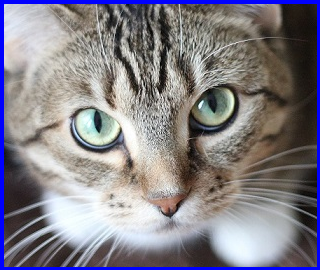

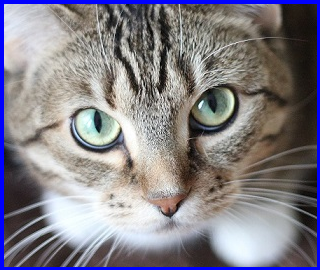

In [44]:
src = cv2.imread('cat2.jpg', cv2.IMREAD_COLOR)
buf = cv2.rectangle(src, (140, 70), (460, 340), color_list[0], 5)
buf2 = buf[70:340, 140:460]
cv2_imshow(buf2)


# 글자 출력 함수 - cv2.putText()

**buf = cv2.putText(src, text, org, fontFace, fontScale, color, thickness)**


src : 입력할 이미지  
text : 입력하고 싶은 텍스트    
org : 텍스트 삽입할 위치 (x, y)  
fontFace : 글꼴  
fontScale : 폰트 크기  
color : 글씨 색, (B, G, R)  
thickness : 폰트 굵기  

👉 fontFace

    Option  /  Value  /  Explain
    FONT_HERSHEY_SIMPLEX / 0 / 중간 크기 산세리프 폰트
    FONT_HERSHEY_PLAIN / 1 / 작은 크기 산세리프 폰트
    FONT_HERSHEY_DUPLEX / 2 / 2줄 산세리프 폰트
    FONT_HERSHEY_COMPLEX / 3 / 중간 크기 세리프 폰트
    FONT_HERSHEY_TRIPLEX / 4 / 3줄 세리프 폰트
    FONT_HERSHEY_COMPLEX_SMALL / 5 / COMPLEX 보다 작은 크기
    FONT_HERSHEY_SCRIPT_SIMPLEX / 6 / 필기체 스타일 폰트
    FONT_HERSHEY_SCRIPT_COMPLEX / 7 / 복잡한 필기체 스타일
    FONT_ITALIC / 16 / 이탈릭체를 위한 플래그

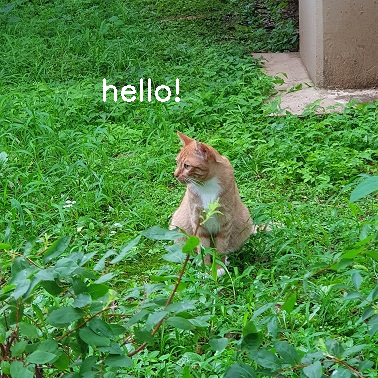

In [49]:
import cv2
from google.colab.patches import cv2_imshow

src = cv2.imread('cat.jpg', cv2.IMREAD_COLOR)
text = "hello!"
buf = cv2.putText(src, text, (100, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, color_list[4], 2)

cv2_imshow(buf)

예제6. dog3.jpg 이미지를 로드하여 아래의 이미지처럼 글씨를 넣어보세요

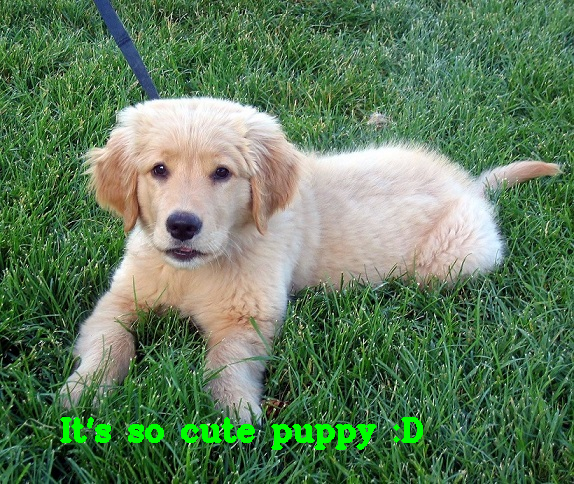

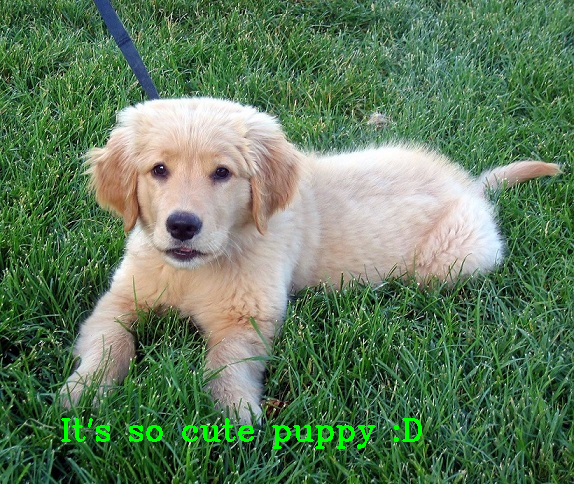

In [51]:
src = cv2.imread('dog3.jpg', cv2.IMREAD_COLOR)
text = "It's so cute puppy :D"
buf = cv2.putText(src, text, (60,440), cv2.FONT_HERSHEY_COMPLEX, 1, color_list[1], 2)
cv2_imshow(buf)

문제. cat3.jpg 이미지를 아래의 사진처럼 꾸며보세요

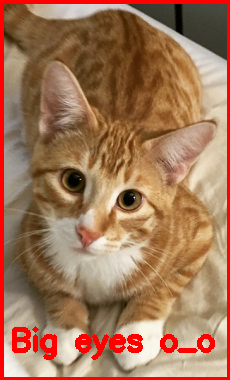